# CodeLab 2 Классические методы машинного зрения

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
gray_image = cv2.imread('data/lena.png', cv2.IMREAD_GRAYSCALE)

# Look at the image pixels values
print(gray_image[:10, :10])

[[169 169 168 167 169 164 170 167 170 167]
 [169 169 168 167 169 164 170 167 170 167]
 [169 169 168 167 169 164 170 167 170 167]
 [169 169 168 167 169 164 170 167 170 167]
 [169 169 168 167 169 164 170 167 170 167]
 [170 170 165 163 168 167 166 167 167 167]
 [167 167 170 165 167 169 167 164 167 169]
 [165 165 164 164 166 166 164 165 166 167]
 [164 164 165 165 167 167 166 165 170 165]
 [163 163 165 165 164 163 163 165 168 162]]


[[16 16 16 16 16 16 17 16 17 16]
 [16 16 16 16 16 16 17 16 17 16]
 [16 16 16 16 16 16 17 16 17 16]
 [16 16 16 16 16 16 17 16 17 16]
 [16 16 16 16 16 16 17 16 17 16]
 [17 17 16 16 16 16 16 16 16 16]
 [16 16 17 16 16 16 16 16 16 16]
 [16 16 16 16 16 16 16 16 16 16]
 [16 16 16 16 16 16 16 16 17 16]
 [16 16 16 16 16 16 16 16 16 16]]


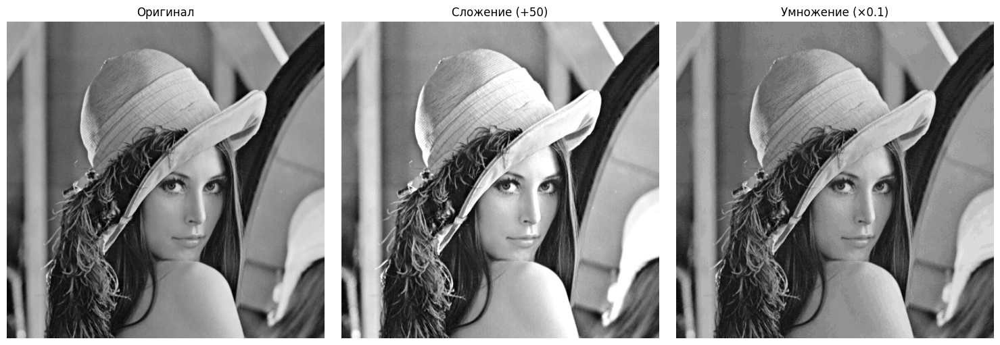

In [3]:
# Math operations on images
# Параметры операций
scalar_add = 50
scalar_mul = 0.1

# Сложение: увеличение яркости
# Обрезка диапазона значений до 255 включена в функцию cv2.add
added = cv2.add(gray_image, np.full_like(gray_image, scalar_add))

# Умножение: увеличение контраста
multiplied = gray_image *  scalar_mul

multiplied = np.clip(multiplied, 0, 255).astype(np.uint8)  # Обрезаем и приводим тип
print(multiplied[:10, :10])
# Настройка отображения через matplotlib
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Оригинал')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(added, cmap='gray')
plt.title(f'Сложение (+{scalar_add})')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(multiplied, cmap='gray')
plt.title(f'Умножение (×{scalar_mul})')
plt.axis('off')

plt.tight_layout()
plt.show()

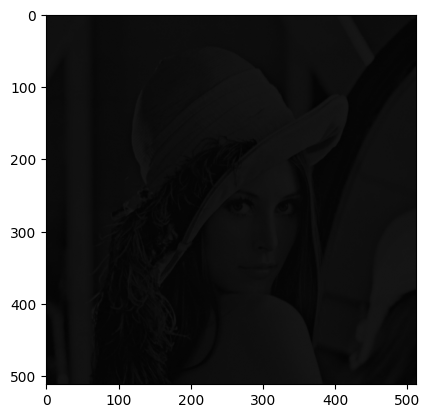

In [4]:
# Обратите внимание, matplotlib по умолчанию выравнивает диапазон яркости
# Отключим эту опцию
plt.imshow(multiplied, cmap='gray', vmin=0, vmax=255)

In [5]:
# Сделаем темные пиксели более яркими с помощью операции np.maximum()
nonlinear_img = np.maximum(gray_image, 100)

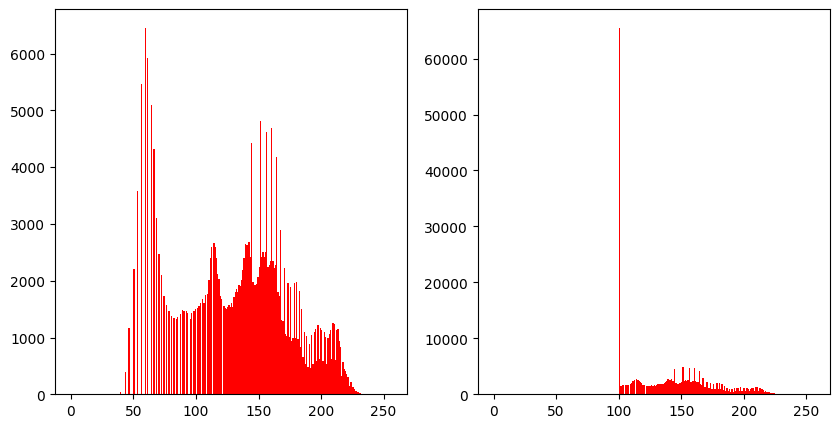

In [6]:
hist,bins = np.histogram(gray_image.flatten(),256,[0,256])
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.hist(gray_image.flatten(), bins=256, range=[0,256], color = 'r')

plt.subplot(1,2,2)
plt.hist(nonlinear_img.flatten(), bins=256, range=[0,256], color = 'r')
plt.show()

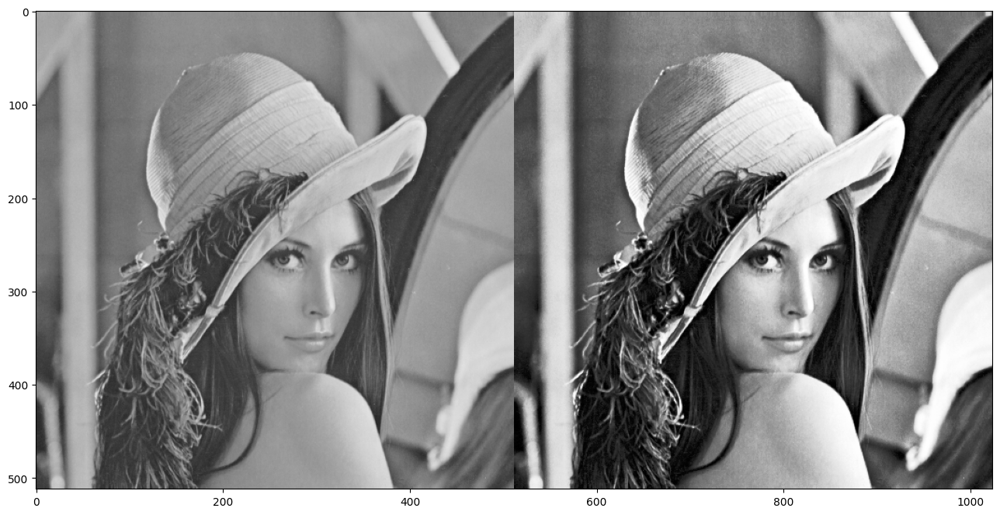

In [7]:
# Эквивализация гистограммы
equ_img = cv2.equalizeHist(gray_image)
result = np.hstack((gray_image, equ_img)) #stacking images side-by-side
plt.figure(figsize=(16, 8))
plt.imshow(result, cmap='gray')

In [8]:
print(f'Original image mean: {gray_image.mean()}, std: {gray_image.std()}')
print(f'Equalized image mean: {equ_img.mean()}, std: {equ_img.std()}')

Original image mean: 132.42729568481445, std: 44.90209985629212
Equalized image mean: 128.65707778930664, std: 73.32327381285563


### Нормализация цветных изображений

(array([8.0000e+00, 1.0090e+03, 4.9764e+04, 6.3636e+04, 5.8579e+04,
        4.6524e+04, 1.7888e+04, 1.6847e+04, 7.4330e+03, 4.5600e+02]),
 array([  8. ,  29.7,  51.4,  73.1,  94.8, 116.5, 138.2, 159.9, 181.6,
        203.3, 225. ]),
 <BarContainer object of 10 artists>)

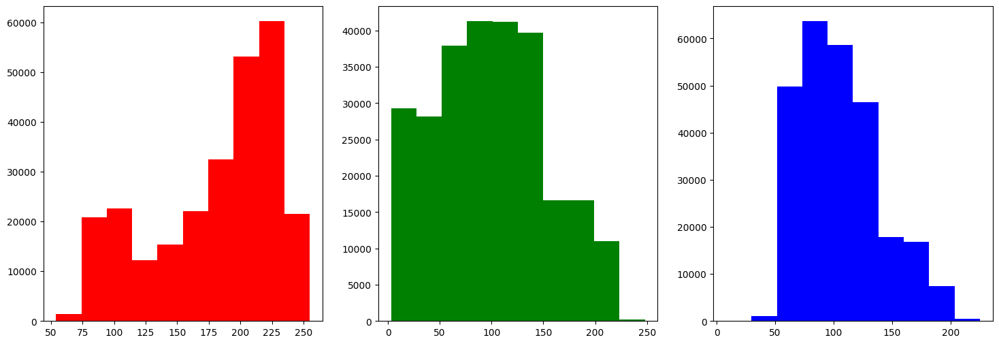

In [9]:
img = cv2.imread('data/lena.png', cv2.IMREAD_COLOR_RGB)

plt.figure(figsize=(18, 6))
plt.subplot(1,3,1)
plt.hist(img[:,:,0].ravel(), color='r')
plt.subplot(1,3,2)
plt.hist(img[:,:,1].ravel(), color='g')
plt.subplot(1,3,3)
plt.hist(img[:,:,2].ravel(), color='b')

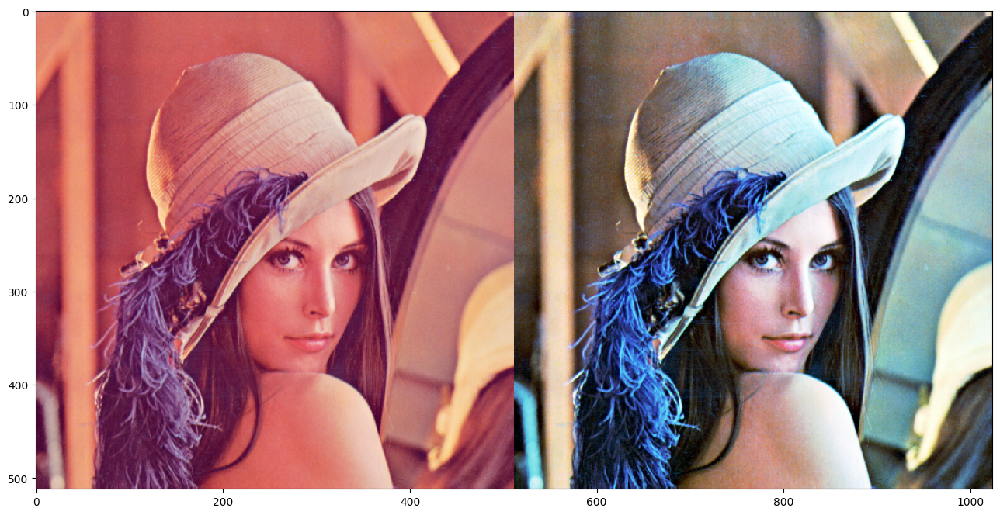

In [10]:
equ_r_img = cv2.equalizeHist(img[:,:,0])
equ_g_img = cv2.equalizeHist(img[:,:,1])
equ_b_img = cv2.equalizeHist(img[:,:,2])

equ_color_img = np.stack((equ_r_img, equ_g_img, equ_b_img), axis=-1)

result = np.hstack((img, equ_color_img)) #stacking images side-by-side
plt.figure(figsize=(16, 8))
plt.imshow(result)

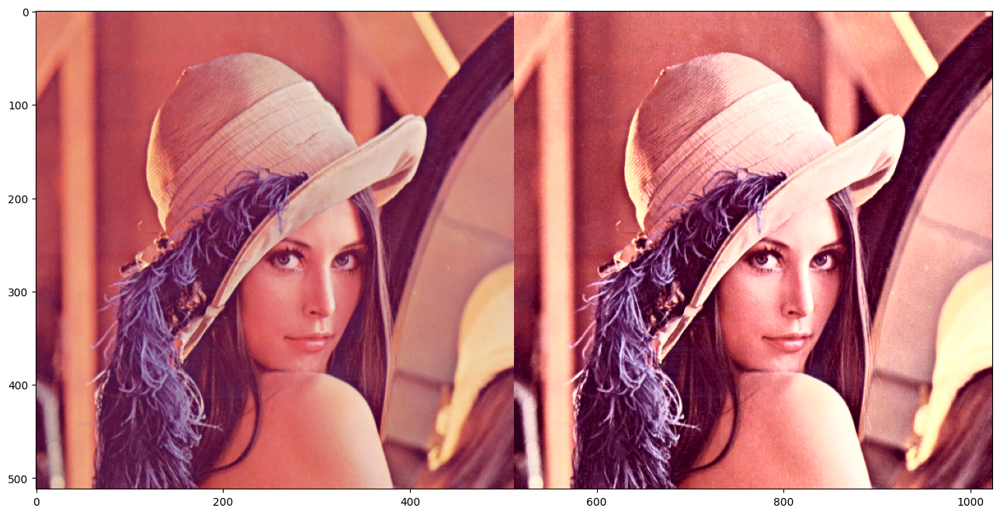

In [11]:
img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)

# equalize the histogram of the Y channel
img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])

# convert the YUV image back to RGB format
img_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

result = np.hstack((img, img_output)) #stacking images side-by-side
plt.figure(figsize=(16, 8))
plt.imshow(result)

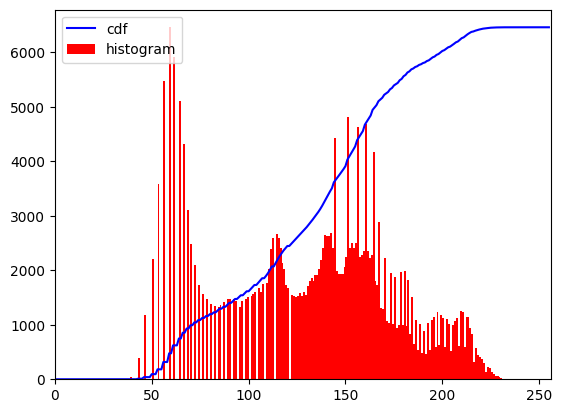

In [12]:
hist,bins = np.histogram(gray_image.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(gray_image.flatten(), bins=256, range=[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

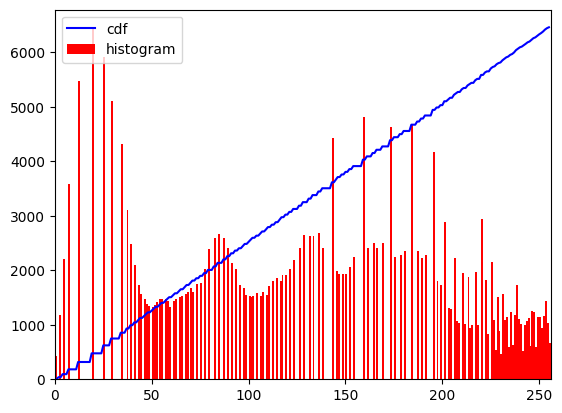

In [13]:
hist,bins = np.histogram(equ_img.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(equ_img.flatten(), bins=256, range=[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

## Свертка с ядром

In [14]:
median_img = np.zeros_like(gray_image)
M, N = gray_image.shape
KERNEL_SIZE = 5

In [15]:
%%time
# too long with python for-cycles
for x in range(M-KERNEL_SIZE):
  for y in range(N-KERNEL_SIZE):
    median_img[x, y] = np.mean(gray_image[x:x+KERNEL_SIZE, y:y+KERNEL_SIZE])

CPU times: user 1.35 s, sys: 1.3 ms, total: 1.36 s
Wall time: 1.36 s


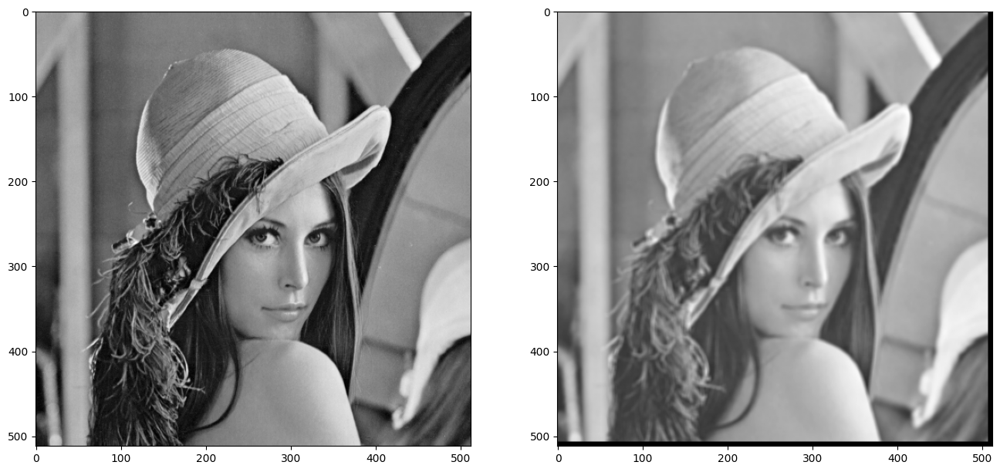

In [16]:
plt.figure(figsize=(16, 8))
plt.subplot(1,2,1)
plt.imshow(gray_image, cmap='gray')
plt.subplot(1,2,2)
plt.imshow(median_img, cmap='gray')

In [17]:
# Свертка с ядром, имеющим константные значения равноценна операции blur (размытие, усреднение)
KERNEL_SIZE = 5
kernel = np.ones((KERNEL_SIZE, KERNEL_SIZE))
kernel = kernel/kernel.size
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]])

In [18]:
gray_image[:KERNEL_SIZE, :KERNEL_SIZE]

array([[169, 169, 168, 167, 169],
       [169, 169, 168, 167, 169],
       [169, 169, 168, 167, 169],
       [169, 169, 168, 167, 169],
       [169, 169, 168, 167, 169]], dtype=uint8)

In [19]:
# Поэлементной умножение окна изображения с коэффициентами маски и их суммирование
np.sum(gray_image[:KERNEL_SIZE, :KERNEL_SIZE] * kernel)

np.float64(168.39999999999998)

In [20]:
%%time
# much faster with opencv
img_median = cv2.filter2D(gray_image, -1, kernel)

CPU times: user 2.41 ms, sys: 591 μs, total: 3 ms
Wall time: 5.44 ms


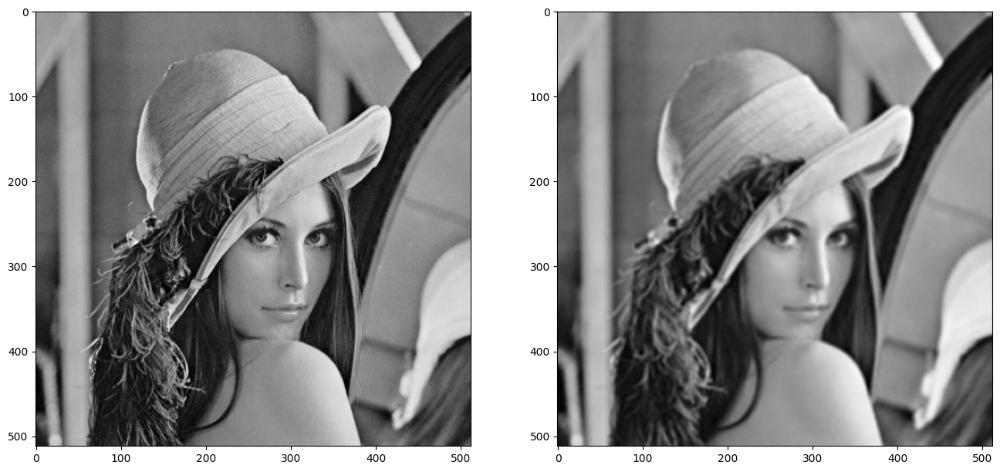

In [21]:
plt.figure(figsize=(16, 8))
plt.subplot(1,2,1)
plt.imshow(gray_image, cmap='gray')
plt.subplot(1,2,2)
plt.imshow(img_median, cmap='gray')

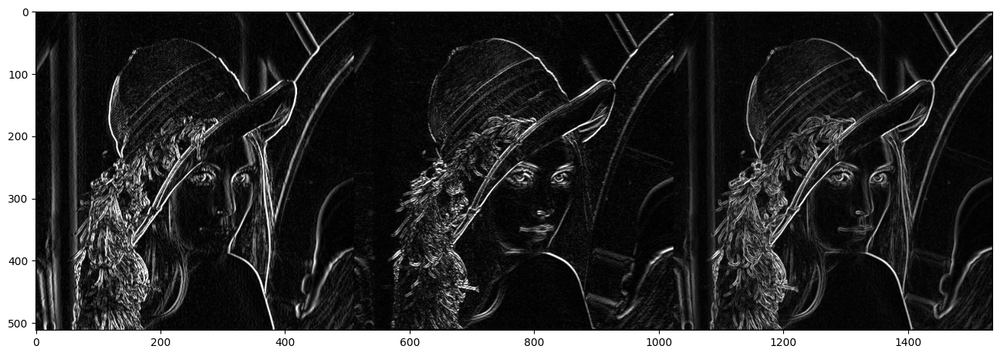

In [22]:
# Оператор Собеля для вычисления градиента изображения

grad_x = cv2.Sobel(gray_image, cv2.CV_16S, 1, 0)  
grad_y = cv2.Sobel(gray_image,cv2.CV_16S, 0, 1)  

absX = cv2.convertScaleAbs(grad_x)   # Перенести обратно на uint8  0-255
absY = cv2.convertScaleAbs(grad_y)  

sobel_img = cv2.addWeighted(absX, 0.5, absY, 0.5, 0)  

plt.figure(figsize=(16, 8))
plt.imshow(np.hstack([absX, absY, sobel_img]), cmap='gray')

## Морфологические преобразования

In [23]:
!wget -O j.png https://docs.opencv.org/4.5.3/Morphology_1_Tutorial_Theory_Original_Image.png

--2026-04-06 17:46:52--  https://docs.opencv.org/4.5.3/Morphology_1_Tutorial_Theory_Original_Image.png
Распознаётся docs.opencv.org (docs.opencv.org)… 172.67.72.85, 104.26.14.224, 104.26.15.224, ...
Подключение к docs.opencv.org (docs.opencv.org)|172.67.72.85|:443... соединение установлено.
HTTP-запрос отправлен. Ожидание ответа… 403 Forbidden
2026-04-06 17:46:52 ОШИБКА 403: Forbidden.



In [24]:
j_img = cv2.imread('data/Dima.jpg', cv2.IMREAD_GRAYSCALE)
j_img.shape

(640, 640)

In [25]:
element = np.array([[0, 1, 1, 0],
                    [1, 1, 1, 1],
                    [1, 1, 1, 1],
                    [0, 1, 1, 0]], dtype=np.uint8)

In [26]:
erosion_img = cv2.erode(j_img, element)
dilate_img = cv2.dilate(j_img, element)

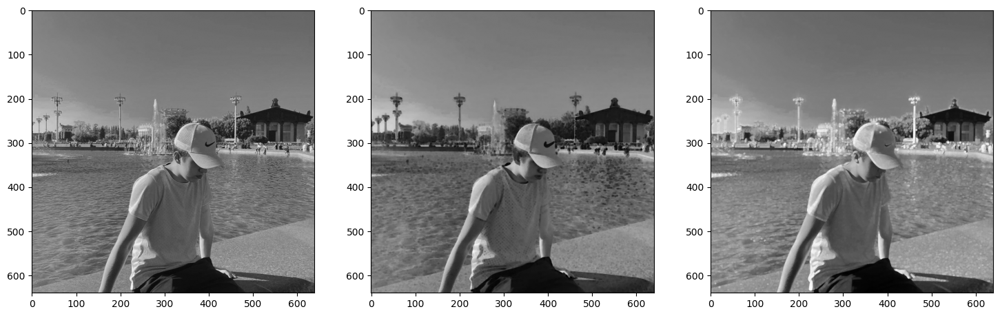

In [27]:
plt.figure(figsize=(18, 6))
plt.subplot(1,3,1)
plt.imshow(j_img, cmap='gray')
plt.subplot(1,3,2)
plt.imshow(erosion_img, cmap='gray')
plt.subplot(1,3,3)
plt.imshow(dilate_img, cmap='gray')

## Геометрические (аффинные) преобразования изображения.


In [28]:
import string

# points a, b, c, d
a, b, c, d = (0, 1, 0), (1, 0, 1), (0, -1, 2), (-1, 0, 3)

# matrix with row vectors of points
A = np.array([a, b, c, d])

# 3x3 Identity transformation matrix
I = np.eye(3)

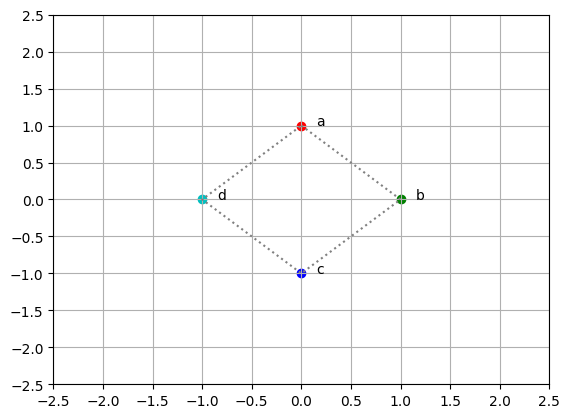

In [29]:
color_lut = 'rgbc' # ['r', 'g', 'b', 'c']
fig = plt.figure()
ax = plt.gca()
xs = []
ys = []
for row in A:
    output_row = I @ row
    x, y, i = output_row
    xs.append(x)
    ys.append(y)
    i = int(i) # convert float to int for indexing
    c = color_lut[i]
    plt.scatter(x, y, color=c)
    plt.text(x + 0.15, y, f"{string.ascii_letters[i]}")
xs.append(xs[0])
ys.append(ys[0])
plt.plot(xs, ys, color="gray", linestyle='dotted')
ax.set_xticks(np.arange(-2.5, 3, 0.5))
ax.set_yticks(np.arange(-2.5, 3, 0.5))
plt.grid()
plt.show()

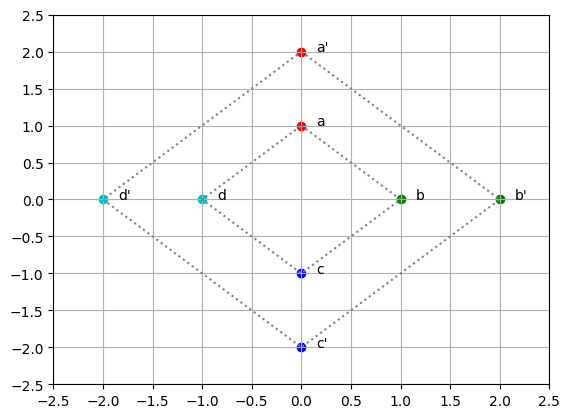

In [30]:
# create the scaling transformation matrix
T_s = np.array([[2, 0, 0], 
                [0, 2, 0], 
                [0, 0, 1]])

fig = plt.figure()
ax = plt.gca()
xs_s = []
ys_s = []
for row in A:
    output_row = T_s @ row
    x, y, i = row
    x_s, y_s, i_s = output_row
    xs_s.append(x_s)
    ys_s.append(y_s)
    i, i_s = int(i), int(i_s) # convert float to int for indexing
    c, c_s = color_lut[i], color_lut[i_s] # these are the same but, its good to be explicit
    plt.scatter(x, y, color=c)
    plt.scatter(x_s, y_s, color=c_s)
    plt.text(x + 0.15, y, f"{string.ascii_letters[int(i)]}")
    plt.text(x_s + 0.15, y_s, f"{string.ascii_letters[int(i_s)]}'")

# draw lines b/w points
xs_s.append(xs_s[0])
ys_s.append(ys_s[0])
plt.plot(xs, ys, color="gray", linestyle='dotted')
plt.plot(xs_s, ys_s, color="gray", linestyle='dotted')
ax.set_xticks(np.arange(-2.5, 3, 0.5))
ax.set_yticks(np.arange(-2.5, 3, 0.5))

plt.grid()
plt.show()

## Задания для самостоятельной работы

**Задание 1:** Реализуйте нормализацию изображения средствами numpy  

Нормализуйте изображения по формуле.
$$img_{n} = \frac{img - mean(img)}{std(img)} $$
Затем масштабируйте нормализованное изображение в интервал [0, 255]  

Отобразите результат вместе с оригинальным изображением и с эквивализированной гистограммой.  

In [31]:
gray_image = cv2.imread('data/Dima.jpg', cv2.IMREAD_GRAYSCALE)

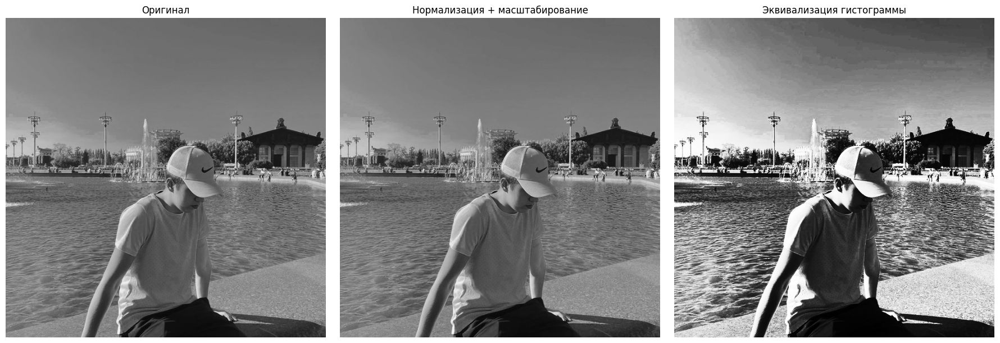

Оригинал: mean=114.46, std=35.00
Нормализованное и масштабированное: mean=113.90, std=34.95
Equalized: mean=128.87, std=73.73


In [32]:
# Задание 1. Нормализация изображения средствами numpy
img = gray_image.astype(np.float32)

# Нормализация: (img - mean) / std
img_n = (img - img.mean()) / img.std()

# Масштабирование в диапазон [0, 255]
img_scaled = (img_n - img_n.min()) / (img_n.max() - img_n.min()) * 255.0
img_scaled = img_scaled.astype(np.uint8)

# Эквивализация гистограммы для сравнения
equ_img = cv2.equalizeHist(gray_image)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(gray_image, cmap='gray', vmin=0, vmax=255)
plt.title('Оригинал')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img_scaled, cmap='gray', vmin=0, vmax=255)
plt.title('Нормализация + масштабирование')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(equ_img, cmap='gray', vmin=0, vmax=255)
plt.title('Эквивализация гистограммы')
plt.axis('off')

plt.tight_layout()
plt.show()

print(f'Оригинал: mean={gray_image.mean():.2f}, std={gray_image.std():.2f}')
print(f'Нормализованное и масштабированное: mean={img_scaled.mean():.2f}, std={img_scaled.std():.2f}')
print(f'Equalized: mean={equ_img.mean():.2f}, std={equ_img.std():.2f}')

**Задание 2:** Отобразите результат свертки с масками (kernels) из лекции: горизонтальная, вертикальная и наклонная 45 градусов. Размер kernel должен быть 5х5.

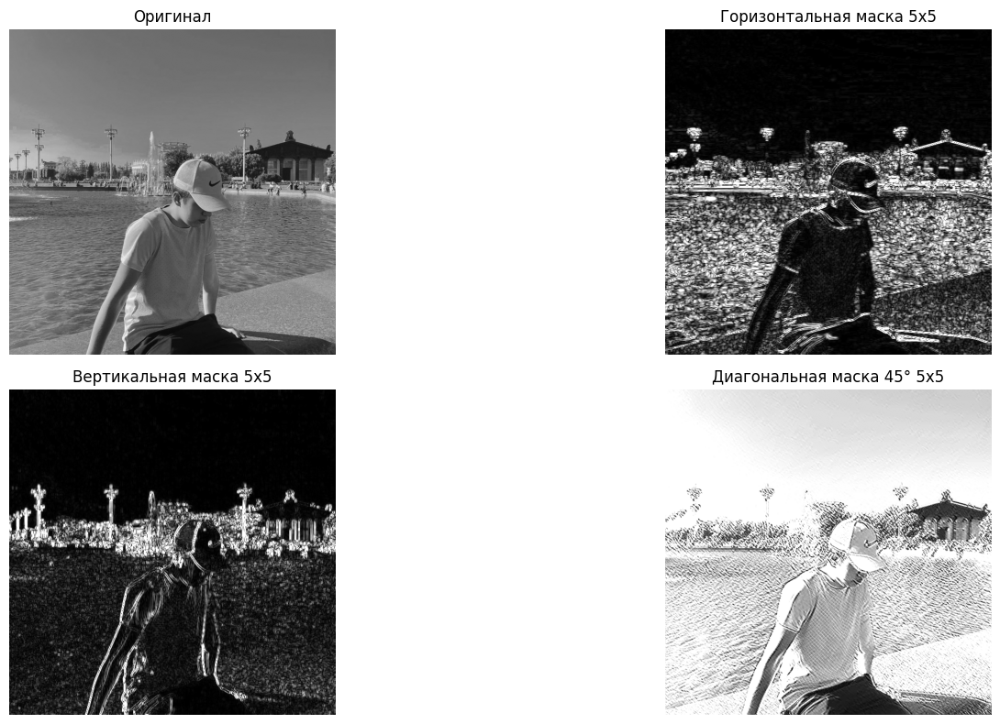

In [33]:
# Задание 2. Свертка с горизонтальной, вертикальной и диагональной (45°) масками 5x5

kernel_horizontal = np.array([
    [-1, -1, -1, -1, -1],
    [ 0,  0,  0,  0,  0],
    [ 2,  2,  2,  2,  2],
    [ 0,  0,  0,  0,  0],
    [-1, -1, -1, -1, -1]
], dtype=np.float32)

kernel_vertical = np.array([
    [-1,  0,  2,  0, -1],
    [-1,  0,  2,  0, -1],
    [-1,  0,  2,  0, -1],
    [-1,  0,  2,  0, -1],
    [-1,  0,  2,  0, -1]
], dtype=np.float32)

kernel_diag45 = np.array([
    [ 2,  0, -1, -1, -1],
    [ 0,  2,  0, -1, -1],
    [-1,  0,  2,  0, -1],
    [-1, -1,  0,  2,  0],
    [-1, -1, -1,  0,  2]
], dtype=np.float32)

resp_h = cv2.filter2D(gray_image, cv2.CV_32F, kernel_horizontal)
resp_v = cv2.filter2D(gray_image, cv2.CV_32F, kernel_vertical)
resp_d = cv2.filter2D(gray_image, cv2.CV_32F, kernel_diag45)

resp_h_vis = cv2.convertScaleAbs(resp_h)
resp_v_vis = cv2.convertScaleAbs(resp_v)
resp_d_vis = cv2.convertScaleAbs(resp_d)

plt.figure(figsize=(18, 8))

plt.subplot(2, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Оригинал')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(resp_h_vis, cmap='gray')
plt.title('Горизонтальная маска 5x5')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(resp_v_vis, cmap='gray')
plt.title('Вертикальная маска 5x5')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(resp_d_vis, cmap='gray')
plt.title('Диагональная маска 45° 5x5')
plt.axis('off')

plt.tight_layout()
plt.show()

**Задание 3:** отобразите результаты операций cv2.opening and cv2.closing Изображения нужно подобрать самостоятельно, чтобы был виден результат преобразований.

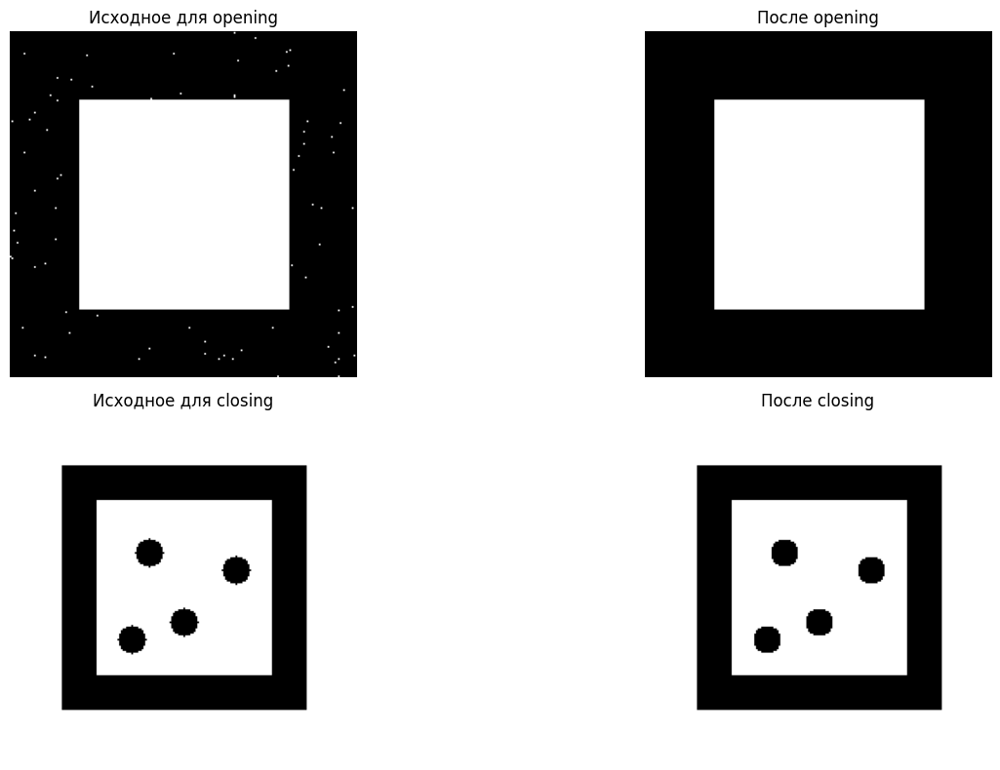

In [34]:
# Изображение для opening: квадрат + мелкий шум
img_open = np.zeros((200, 200), dtype=np.uint8)
cv2.rectangle(img_open, (40, 40), (160, 160), 255, -1)

np.random.seed(42)
noise_points = np.random.randint(0, 200, size=(120, 2))
for y, x in noise_points:
    img_open[y, x] = 255

# Изображение для closing: квадрат с чёрными дырками
img_close = np.ones((200, 200), dtype=np.uint8) * 255
cv2.rectangle(img_close, (30, 30), (170, 170), 0, -1)
cv2.rectangle(img_close, (50, 50), (150, 150), 255, -1)

holes = [(80, 80), (100, 120), (130, 90), (70, 130)]
for x, y in holes:
    cv2.circle(img_close, (x, y), 8, 0, -1)

kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))

opened = cv2.morphologyEx(img_open, cv2.MORPH_OPEN, kernel)
closed = cv2.morphologyEx(img_close, cv2.MORPH_CLOSE, kernel)

plt.figure(figsize=(16, 8))

plt.subplot(2, 2, 1)
plt.imshow(img_open, cmap='gray')
plt.title('Исходное для opening')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(opened, cmap='gray')
plt.title('После opening')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(img_close, cmap='gray')
plt.title('Исходное для closing')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(closed, cmap='gray')
plt.title('После closing')
plt.axis('off')

plt.tight_layout()
plt.show()

 **Задание 4**: реализуйте два любых на выбор аффинных преобразования из лекции. 

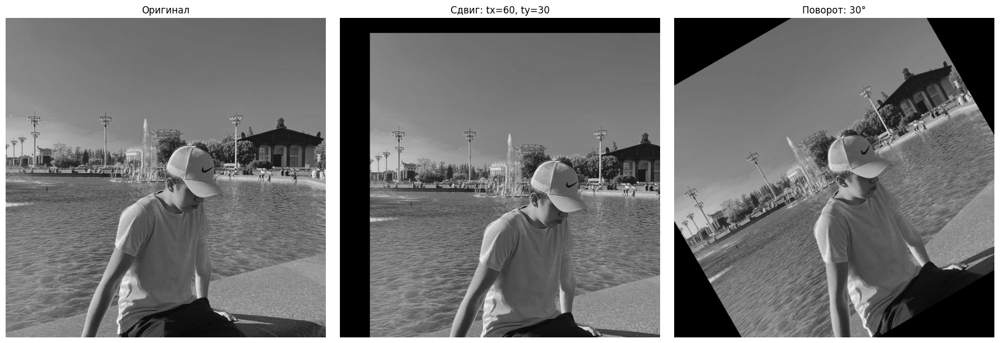

In [35]:
# Задание 4. Два аффинных преобразования: сдвиг и поворот
# loggloss = -sum((1-y)*log(1-p) + y*log(p))
h, w = gray_image.shape

# 1) Сдвиг
tx, ty = 60, 30
M_translate = np.float32([
    [1, 0, tx],
    [0, 1, ty]
])
translated = cv2.warpAffine(gray_image, M_translate, (w, h))

# 2) Поворот вокруг центра изображения
center = (w // 2, h // 2)
angle = 30
scale = 1.0
M_rotate = cv2.getRotationMatrix2D(center, angle, scale)
rotated = cv2.warpAffine(gray_image, M_rotate, (w, h))

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Оригинал')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(translated, cmap='gray')
plt.title(f'Сдвиг: tx={tx}, ty={ty}')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(rotated, cmap='gray')
plt.title(f'Поворот: {angle}°')
plt.axis('off')

plt.tight_layout()
plt.show()

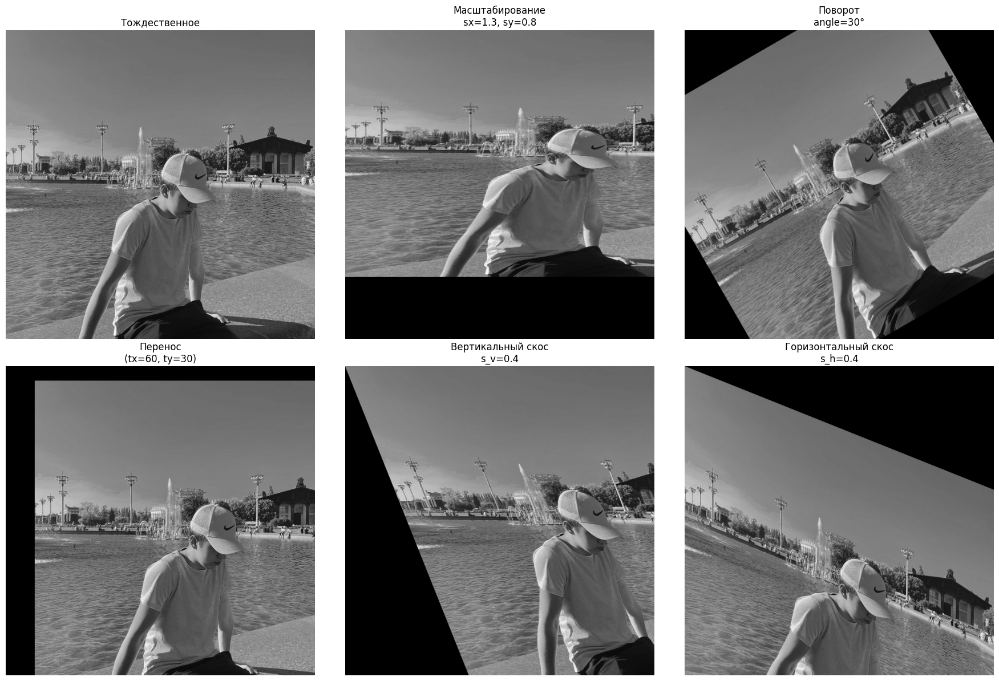

In [36]:
# Задание 4. Все аффинные преобразования из таблицы:
# тождественное, масштабирование, поворот, перенос, вертикальный скос, горизонтальный скос

h, w = gray_image.shape

# 1. Тождественное преобразование
M_identity = np.float32([
    [1, 0, 0],
    [0, 1, 0]
])
img_identity = cv2.warpAffine(gray_image, M_identity, (w, h))

# 2. Масштабирование
sx, sy = 1.3, 0.8
M_scale = np.float32([
    [sx, 0,  0],
    [0,  sy, 0]
])
img_scale = cv2.warpAffine(gray_image, M_scale, (w, h))

# 3. Поворот
center = (w // 2, h // 2)
angle = 30
M_rotate = cv2.getRotationMatrix2D(center, angle, 1.0)
img_rotate = cv2.warpAffine(gray_image, M_rotate, (w, h))

# 4. Параллельный перенос (сдвиг)
tx, ty = 60, 30
M_translate = np.float32([
    [1, 0, tx],
    [0, 1, ty]
])
img_translate = cv2.warpAffine(gray_image, M_translate, (w, h))

# 5. Вертикальный скос
# x = v + s_v * w
# y = w
s_v = 0.4
M_vertical_shear = np.float32([
    [1, s_v, 0],
    [0, 1,   0]
])
img_vertical_shear = cv2.warpAffine(gray_image, M_vertical_shear, (w, h))

# 6. Горизонтальный скос
# x = v
# y = s_h * v + w
s_h = 0.4
M_horizontal_shear = np.float32([
    [1,   0, 0],
    [s_h, 1, 0]
])
img_horizontal_shear = cv2.warpAffine(gray_image, M_horizontal_shear, (w, h))

# Визуализация
plt.figure(figsize=(18, 12))

plt.subplot(2, 3, 1)
plt.imshow(img_identity, cmap='gray')
plt.title('Тождественное')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(img_scale, cmap='gray')
plt.title(f'Масштабирование\nsx={sx}, sy={sy}')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(img_rotate, cmap='gray')
plt.title(f'Поворот\nangle={angle}°')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(img_translate, cmap='gray')
plt.title(f'Перенос\n(tx={tx}, ty={ty})')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(img_vertical_shear, cmap='gray')
plt.title(f'Вертикальный скос\ns_v={s_v}')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(img_horizontal_shear, cmap='gray')
plt.title(f'Горизонтальный скос\ns_h={s_h}')
plt.axis('off')

plt.tight_layout()
plt.show()